# Weight matrix analysis for $L=100$

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pickle
from scipy import stats
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
torch.manual_seed(12)

import sys
sys.path.append('/modules')
from modules.mc_ising2d import IsingMC
from modules.net import Net
from rbm import RBM

Tc_Ons = 2 / ( np.log(1 + np.sqrt(2)) )
Tc_MF = 4.0
L = 100

Auxiliary plot function.

In [2]:
def plot_heatmap_sns(WW, 
                     L, 
                     type_L = 'ALL',
                     publication= False,
                     eps= False,
                     save= False):
    
    L_str = str(L)
    
    if publication:
        fig, ax = plt.subplots(figsize=(3.375, 0.678*3.375))
    else:
        fig, ax = plt.subplots(figsize=(20,15))
    
    ax = sns.heatmap(WW, 
               xticklabels = L, yticklabels = L,
               linewidths= 0.0,
               cmap= 'viridis')
    
    if publication:
        
        ax.tick_params(axis='y', labelsize=5)
        ax.tick_params(axis='x', labelsize=5)
        
        cbar = ax.collections[0].colorbar
        cbar.ax.tick_params(labelsize=5)
        
        markersize = 4.0
        linewidth= 0.4
        fontsize_l = 7.0
        fontsize_t = 8.0
        fontsize_lg= 5.0
        capsize= 2.0   
        elinewidth= 0.2
        markeredgewidth = 0.2
        if eps:
            path_fig = 'figures/PUB_WW_L%s_%s_heatmap.eps' % (L_str, type_L)
        else:
            path_fig = 'figures/PUB_WW_L%s_%s_heatmap.pdf' % (L_str, type_L)
        
    else:
               
        markersize= 10.0
        linewidth= 0.8
        fontsize_l= 12.0
        fontsize_t= 12.0
        fontsize_lg= 10.0
        capsize= 5.0
        elinewidth= 0.5
        markeredgewidth= 0.5
        if eps:
            path_fig = 'figures/WW_L%s_%s_heatmap.eps' % (L_str, type_L)
        else:
            path_fig = 'figures/WW_L%s_%s_heatmap.pdf' % (L_str, type_L)
            
    

    if save:
        if eps:
            fig.savefig(path_fig, bbox_inches='tight', dpi= 1200)
        else:
            fig.savefig(path_fig, bbox_inches='tight')

In [15]:
def plot_heatmaps(WW_1,
                  WW_2,
                  WW_3,
                  WW_4,
                  L,
                  label_1= '${\cal T}_V$',
                  label_2= '$T=0$',
                  label_3= '$T= \infty$',
                  label_4= '$T=0$ and $T=\infty$',
                  cmap= 'viridis',
                  title_size= 6,
                  labelsize= 3,
                  zoom= False, 
                  publication= False,
                  eps= False,
                  save= False):
    
    L_str = str(L)
    
    if publication:
        fig, axs = plt.subplots(nrows= 2, ncols= 2, figsize=(3.375, 0.678*3.375))
    else:
        fig, axs = plt.subplots(nrows= 2, ncols= 2)
    
        
    im0 = axs[0, 0].imshow(WW_1, cmap= cmap, alpha= 1.0)
    axs[0, 0].set_title(label_1, fontsize= title_size)
    
   
    im1 = axs[0, 1].imshow(WW_2, cmap= cmap, alpha= 1.0)
    axs[0, 1].set_title(label_2, fontsize= title_size)

    im2= axs[1, 0].imshow(WW_3, cmap= cmap, alpha= 1.0)
    axs[1, 0].set_title(label_3, fontsize= title_size)

    im3 = axs[1, 1].imshow(WW_4, cmap= cmap, alpha= 1.0)
    axs[1, 1].set_title(label_4, fontsize= title_size)
    
    if zoom:
        factor = 500
        axs[0, 0].set_xlim([int(L*L/2) - factor, int(L*L/2) + factor])
        axs[0, 0].set_ylim([int(L*L/2) + factor, int(L*L/2) - factor])
        axs[0, 1].set_xlim([int(L*L/2) - factor, int(L*L/2) + factor])
        axs[0, 1].set_ylim([int(L*L/2) + factor, int(L*L/2) - factor])
        axs[1, 0].set_xlim([int(L*L/2) - factor, int(L*L/2) + factor])
        axs[1, 0].set_ylim([int(L*L/2) + factor, int(L*L/2) - factor])
        axs[1, 1].set_xlim([int(L*L/2) - factor, int(L*L/2) + factor])
        axs[1, 1].set_ylim([int(L*L/2) + factor, int(L*L/2) - factor])
        
        axs[0, 0].set_xticks(np.arange(int(L*L/2) - factor, int(L*L/2) + 3*factor, 2*factor ))
        axs[0, 0].set_yticks(np.arange(int(L*L/2) - factor, int(L*L/2) + 3*factor, 2*factor ))
        axs[0, 1].set_xticks(np.arange(int(L*L/2) - factor, int(L*L/2) + 3*factor, 2*factor ))
        axs[0, 1].set_yticks(np.arange(int(L*L/2) - factor, int(L*L/2) + 3*factor, 2*factor ))
        axs[1, 0].set_xticks(np.arange(int(L*L/2) - factor, int(L*L/2) + 3*factor, 2*factor ))
        axs[1, 0].set_yticks(np.arange(int(L*L/2) - factor, int(L*L/2) + 3*factor, 2*factor ))
        axs[1, 1].set_xticks(np.arange(int(L*L/2) - factor, int(L*L/2) + 3*factor, 2*factor ))
        axs[1, 1].set_yticks(np.arange(int(L*L/2) - factor, int(L*L/2) + 3*factor, 2*factor ))
        
    else:
        axs[0, 0].set_xticks(np.arange(0, 2*L*L, L*L))
        axs[0, 0].set_yticks(np.arange(0, 2*L*L, L*L))
        axs[0, 1].set_xticks(np.arange(0, 2*L*L, L*L))
        axs[0, 1].set_yticks(np.arange(0, 2*L*L, L*L))
        axs[1, 0].set_xticks(np.arange(0, 2*L*L, L*L))
        axs[1, 0].set_yticks(np.arange(0, 2*L*L, L*L))
        axs[1, 1].set_xticks(np.arange(0, 2*L*L, L*L))
        axs[1, 1].set_yticks(np.arange(0, 2*L*L, L*L))
        
            
    axs[0, 0].tick_params(axis='y', labelsize= labelsize, width=0.0, length=0.0)
    axs[0, 0].tick_params(axis='x', labelsize= labelsize, width=0.0, length=0.0)
    axs[0, 1].tick_params(axis='y', labelsize= labelsize, width=0.0, length=0.0)
    axs[0, 1].tick_params(axis='x', labelsize= labelsize, width=0.0, length=0.0)
    axs[1, 0].tick_params(axis='y', labelsize= labelsize, width=0.0, length=0.0)
    axs[1, 0].tick_params(axis='x', labelsize= labelsize, width=0.0, length=0.0)
    axs[1, 1].tick_params(axis='y', labelsize= labelsize, width=0.0, length=0.0)
    axs[1, 1].tick_params(axis='x', labelsize= labelsize, width=0.0, length=0.0)
    
    
    if publication:
        plt.setp(axs[0, 0].spines.values(), linewidth=0.3)
        plt.setp(axs[0, 1].spines.values(), linewidth=0.3)
        plt.setp(axs[1, 0].spines.values(), linewidth=0.3)
        plt.setp(axs[1, 1].spines.values(), linewidth=0.3)
        
        if eps:
            if zoom:
                path_fig = 'figures/PUB_WW_L%s_heatmaps_together_ZOOM.eps' % L_str
            else:
                path_fig = 'figures/PUB_WW_L%s_heatmaps_together.eps' % L_str
        else:
            if zoom:
                path_fig = 'figures/PUB_WW_L%s_heatmaps_together_ZOOM.pdf' % L_str
            else:
                path_fig = 'figures/PUB_WW_L%s_heatmaps_together.pdf' % L_str
        
    else:
        
        if eps:
            if zoom:
                path_fig = 'figures/WW_L%s_heatmaps_together_ZOOM.eps' % L_str
            else:
                path_fig = 'figures/WW_L%s_heatmaps_together.eps' % L_str
                
        else:
            if zoom:
                path_fig = 'figures/WW_L%s_heatmaps_together_ZOOM.pdf' % L_str
            else:
                path_fig = 'figures/WW_L%s_heatmaps_together.pdf' % L_str
            
    cb0 = fig.colorbar(im0, ax=axs[0, 0])
    cb1 = fig.colorbar(im1, ax=axs[0, 1])
    cb2 = fig.colorbar(im2, ax=axs[1, 0])
    cb3 = fig.colorbar(im3, ax=axs[1, 1])
    
    if publication:   
        cb0.ax.tick_params(labelsize= labelsize, width= 0.0, length=0.0)
        cb1.ax.tick_params(labelsize= labelsize, width= 0.0, length=0.0)
        cb2.ax.tick_params(labelsize= labelsize, width= 0.0, length=0.0)
        cb3.ax.tick_params(labelsize= labelsize, width= 0.0, length=0.0)
        
    else:
        cb0.ax.tick_params(labelsize= labelsize, width=0.0, length=0.0)
        cb1.ax.tick_params(labelsize= labelsize, width=0.0, length=0.0)
        cb2.ax.tick_params(labelsize= labelsize, width=0.0, length=0.0)
        cb3.ax.tick_params(labelsize= labelsize, width=0.0, length=0.0)
        
    cb0.outline.set_visible(False)
    cb1.outline.set_visible(False)
    cb2.outline.set_visible(False)
    cb3.outline.set_visible(False)
        
     
    plt.subplots_adjust(hspace= 0.5, wspace=0.0)
 
    if save:
        fig.savefig(path_fig, bbox_inches='tight', dpi= 1200)

Auxiliary plot function.

In [3]:
def plot_eigen(x, 
               y1,
               y2,
               y3,
               y4,
               L,
               loc_legend= 'upper right',
               label_1= '${\cal T}_V$',
               label_2= '$T=0$',
               label_3= '$T=\infty$',
               label_4= '$T=0$ / $T=\infty$',
               xlabel= 'Index of the eigenvalue',
               ylabel= 'Eigenvalues of ${\cal W}{\cal W}^{T}$',
               SVD= False, 
               publication= False,
               eps= False,
               save= False):
    
    L_str = str(L)
    
    if publication:
        plt.figure(figsize=(3.375, 0.678*3.375))
        plt.xticks(fontsize= 6)
        plt.yticks(fontsize= 6)
        markersize = 4.0
        linewidth= 0.4
        fontsize_l = 7.0
        fontsize_t = 8.0
        fontsize_lg= 5.0
        capsize= 2.0   
        elinewidth= 0.2
        markeredgewidth = 0.2
        
        if eps:
            if SVD:
                path_fig = 'figures/PUB_W_svd_L%s.eps' % L_str
            else:
                path_fig = 'figures/PUB_WW_eigen_L%s.eps' % L_str
        else:
            if SVD:
                path_fig = 'figures/PUB_W_svd_L%s.pdf' % L_str
            else:
                path_fig = 'figures/PUB_WW_eigen_L%s.pdf' % L_str
            
            
        
    else:
        markersize= 10.0
        linewidth= 0.8
        fontsize_l= 12.0
        fontsize_t= 12.0
        fontsize_lg= 10.0
        capsize= 5.0
        elinewidth= 0.5
        markeredgewidth= 0.5
        
        if eps:
            if SVD:
                path_fig = 'figures/W_svd_L0%s.eps' % L_str
            else:
                path_fig = 'figures/WW_eigen_L0%s.eps' % L_str
        else:
            if SVD:
                path_fig = 'figures/W_svd_L0%s.pdf' % L_str
            else:
                path_fig = 'figures/WW_eigen_L0%s.pdf' % L_str
            
            
    plt.plot(x, y1, 
             marker= '.',
             markersize= markersize,
             linewidth= linewidth,
             label= label_1)
    
    plt.plot(x, y2, 
             marker= '.',
             markersize= markersize,
             linewidth= linewidth,
             label= label_2)
        
    plt.plot(x, y3, 
             marker= '.',
             markersize= markersize,
             linewidth= linewidth,
             label= label_3)
            
    plt.plot(x, y4, 
             marker= '.',
             markersize= markersize,
             linewidth= linewidth,
             label= label_4)
    
    plt.xlabel(xlabel, fontsize= fontsize_l)
    plt.ylabel(ylabel, fontsize= fontsize_l)
        
    plt.legend(fontsize= fontsize_lg,
               loc= loc_legend)    

    if save:
        if eps:
            plt.savefig(path_fig, bbox_inches='tight', dpi= 1200)
        else:
            plt.savefig(path_fig, bbox_inches='tight')

Loading the RBM models.

In [4]:
rbm_L100_all = RBM()
rbm_L100_all = torch.load('RBM_trained_models/RBM_model_T_complete_nv10000_nh10000_lr1.0E-03_k1_bsize100_nepochs2000.pt',
                 map_location=torch.device('cpu'))

W_L100_all, v, h = rbm_L100_all.parameters()
del v
del h


rbm_L100_low = RBM()
rbm_L100_low = torch.load('RBM_trained_models/RBM_model_T_zero_only_nv10000_nh10000_lr1.0E-02_k1_bsize100_nepochs1000.pt',
                 map_location=torch.device('cpu'))

W_L100_low, v, h = rbm_L100_low.parameters()
del v
del h


rbm_L100_high = RBM()
rbm_L100_high = torch.load('RBM_trained_models/RBM_model_T_inf_only_nv10000_nh10000_lr1.0E-03_k1_bsize100_nepochs1000.pt',
                 map_location=torch.device('cpu'))

W_L100_high, v, h = rbm_L100_high.parameters()
del v
del h


rbm_L100_low_high = RBM()
rbm_L100_low_high = torch.load('RBM_trained_models/RBM_model_T_zero_inf_nv10000_nh10000_lr1.0E-03_k1_bsize100_nepochs1000.pt',
                 map_location=torch.device('cpu'))

W_L100_low_high, v, h = rbm_L100_low_high.parameters()
del v
del h

/home/rodrigo/anaconda3/lib/python3.7/site-packages/torch/serialization.py:454: SourceChangeWarning: source code of class 'rbm.RBM' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)


## Complete

### Analysis of $ {\cal W}$

/home/rodsveiga/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


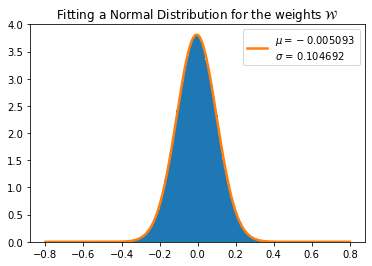

In [37]:
W_ = W_L100_all.numpy().reshape((W_L100_all.shape[0]*W_L100_all.shape[1]))

# Plot normalized histogram 
plt.hist(W_, bins= 100, density= True)

# Maximum and minimum of xticks to compute the theoretical distribution 
x_min, x_max = min(plt.xticks()[0]), max(plt.xticks()[0])  
domain = np.linspace(x_min, x_max, len(W_))

# Fitting a normal distribution
muW_, sigmaW_ = stats.norm.fit(W_) 

plot_pdf = stats.norm.pdf(domain, muW_, sigmaW_) # Fitting the PDF in the interval


plt.plot(domain, plot_pdf, linewidth= 2.5,
         label= '$\mu= %f$ \n$\sigma$ = %f' % (muW_, sigmaW_ ))

plt.title('Fitting a Normal Distribution for the weights ${\cal W}$')
plt.legend()
#plt.xlim([-5, 5])
plt.show()

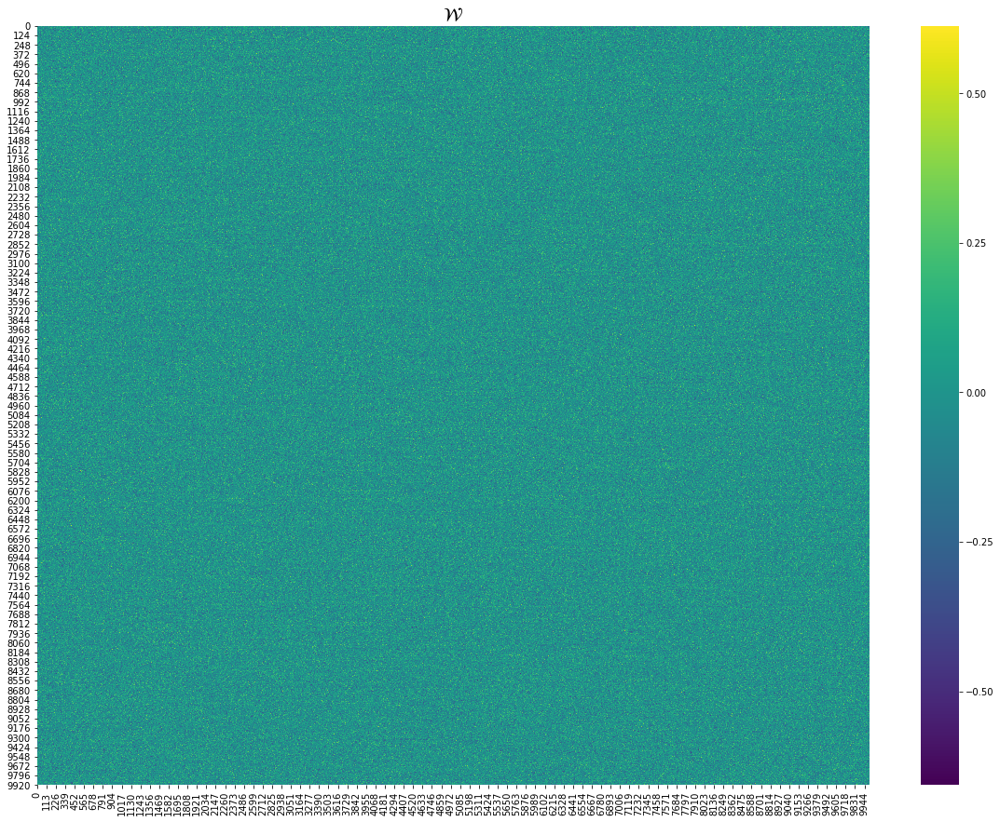

In [4]:
plt.figure(figsize=(20,15))
plt.title('${\cal W} $', fontsize= 20)
sns.heatmap(W_L100_all, linewidths= 0.0, cmap= 'viridis')
plt.show()

#### SVD of ${\cal W} $

In [6]:
u_L100_all, s_L100_all, v_L100_all = torch.svd(W_L100_all, compute_uv= True)

[]

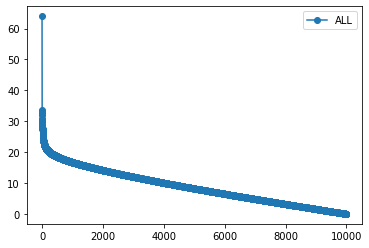

In [7]:
plt.plot(s_L100_all.numpy(), label= 'ALL', marker= 'o')
plt.legend()
plt.plot()

Saving the singular value decomposition.

In [10]:
type_L = 'ALL'
L_str = str(L)

file_name = 'weight_analysis/L%s/L%s_%s_W_svd_left_eigvec.pt' % (L_str, L_str, type_L)
torch.save(u_L100_all, file_name)

file_name = 'weight_analysis/L%s/L%s_%s_W_svd_right_eigvec.pt' % (L_str, L_str, type_L)
torch.save(v_L100_all, file_name)

file_name = 'weight_analysis/L%s/L%s_%s_W_svd_singular_values.pt' % (L_str, L_str, type_L)
torch.save(s_L100_all, file_name)

#### Reduced ${\cal W} {\cal W}^{T}$ matrix

Here we construct the matrix ${\cal W} {\cal W}^{T}$ only with its first singular component.

In [77]:
s_L100_all_red = s_L100_all.clone()

s_L100_all_red[s_L100_all_red!= s_L100_all_red[0]] = 0

W_all_red = torch.mm(torch.mm(u_L100_all, torch.diag(s_L100_all_red)), v_L100_all.t())

In [81]:
WW = torch.mm(W_all_red.t(), W_all_red)

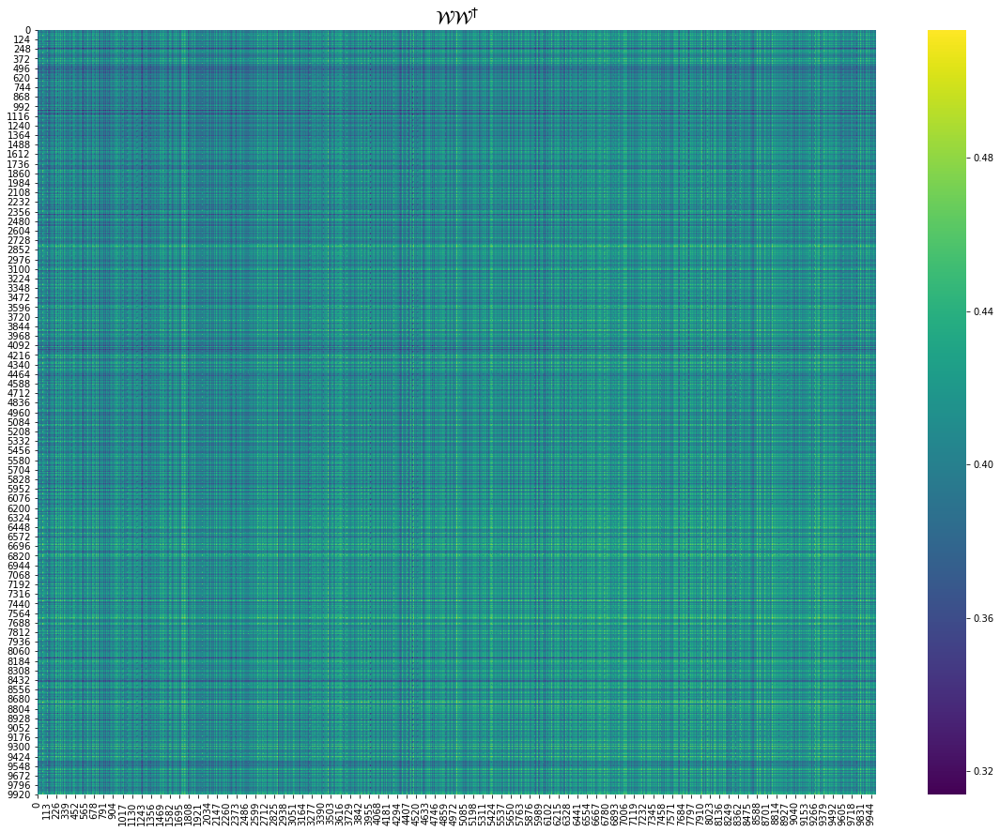

In [82]:
plt.figure(figsize=(20,15))
plt.title('${\cal W} {\cal W}^{\dag}$', fontsize= 20)
sns.heatmap(WW, linewidths= 0.0, cmap= 'viridis')
plt.show()

#### Sampling Ising states using the left singular vectors $u$

mag =  0.00700


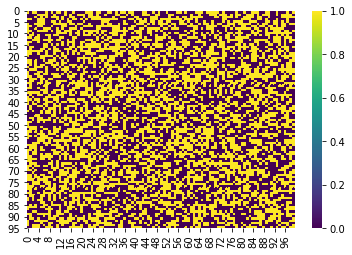

mag =  0.01320


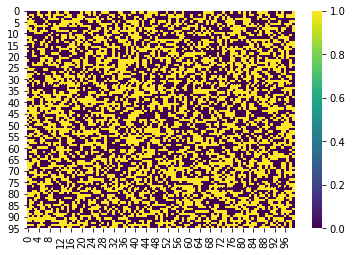

mag =  0.00900


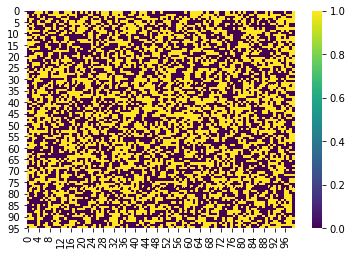

mag =  0.00340


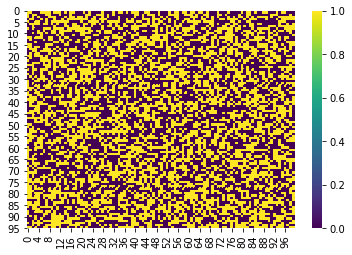

mag =  0.00740


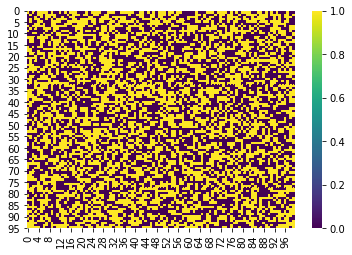

mag =  0.00760


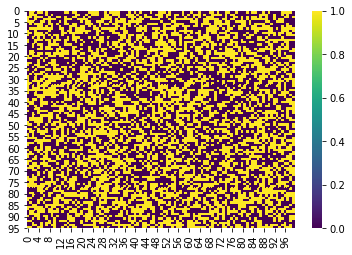

mag =  0.00320


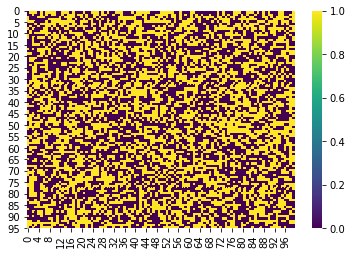

mag =  0.00040


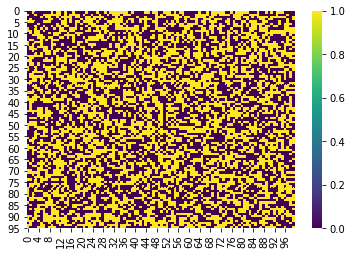

mag =  0.00220


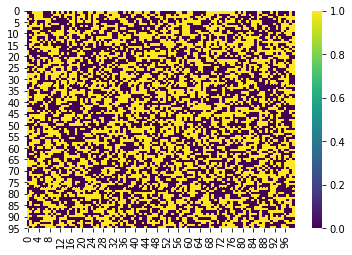

mag =  0.00560


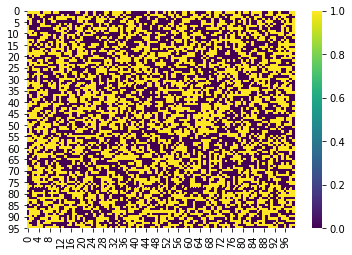

In [49]:
for j in range(10):
    p = torch.sigmoid(u_L100_all[j])
    rand_prob = torch.rand(p.size())
    state = F.relu( torch.sign( p - rand_prob ) ).reshape((100,100))
    mag = (2*state - 1 ).mean().abs().item()
    print('mag =  %.5f' % mag)
    sns.heatmap(state, linewidths= 0.0, cmap= 'viridis')
    plt.show()

#### Sampling Ising states using the right singular vectors $v$

mag =  0.01300


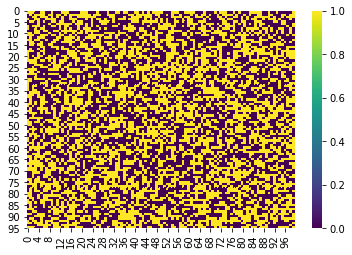

mag =  0.01040


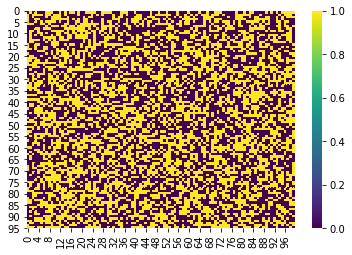

mag =  0.00040


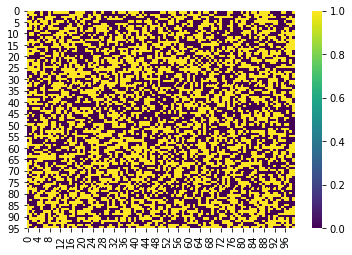

mag =  0.02100


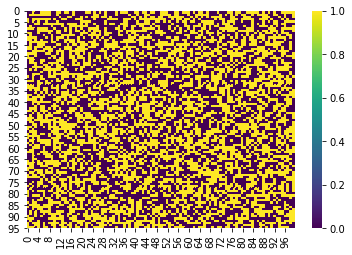

mag =  0.02060


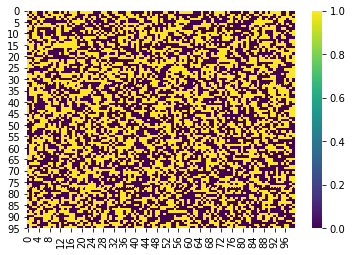

mag =  0.01180


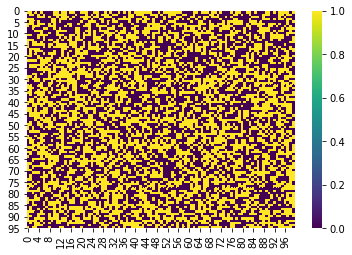

mag =  0.00960


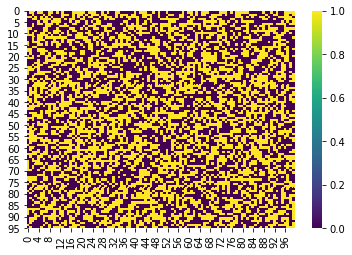

mag =  0.00780


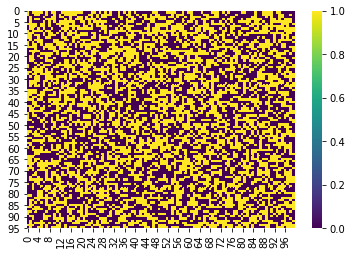

mag =  0.00980


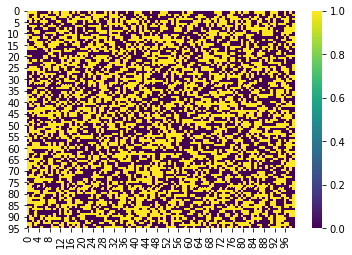

mag =  0.00440


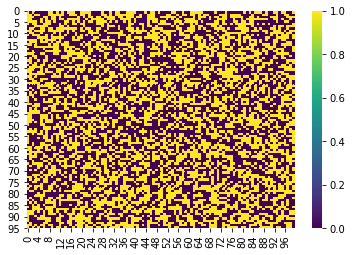

In [55]:
for j in range(10):
    p = torch.sigmoid(v_L100_all[j])
    rand_prob = torch.rand(p.size())
    state = F.relu( torch.sign( p - rand_prob ) ).reshape((100,100))
    sns.heatmap(state, linewidths= 0.0, cmap= 'viridis')
    mag = (2*state - 1 ).mean().abs().item()
    print('mag =  %.5f' % mag)
    plt.show()

#### Eigenvalues of ${\cal W} $

There are imaginary eigenvalues.

In [11]:
eigen_val_vec_all_W = torch.eig(W_L100_all, eigenvectors= False)

In [12]:
eigen_all_W = eigen_val_vec_all_W[0]
eigen_all_W

tensor([[-5.0945e+01,  0.0000e+00],
        [ 7.7436e+00,  7.1586e+00],
        [ 7.7436e+00, -7.1586e+00],
        ...,
        [-1.0435e-01,  7.2195e-02],
        [-1.0435e-01, -7.2195e-02],
        [ 1.6747e-02,  0.0000e+00]])

### Analysis of $ {\cal W} {\cal W}^{T}$

In [6]:
WW_all = torch.mm(W_L100_all.t(), W_L100_all)

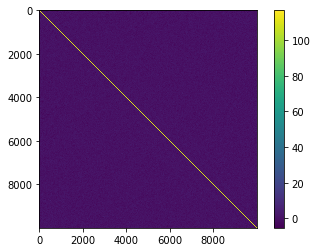

In [14]:
plt.imshow(WW_all.numpy(), cmap= 'viridis', alpha= 1.0)
plt.colorbar()
plt.xticks(np.arange(0, L*L, L*20))
plt.yticks(np.arange(0, L*L, L*20))
plt.show()

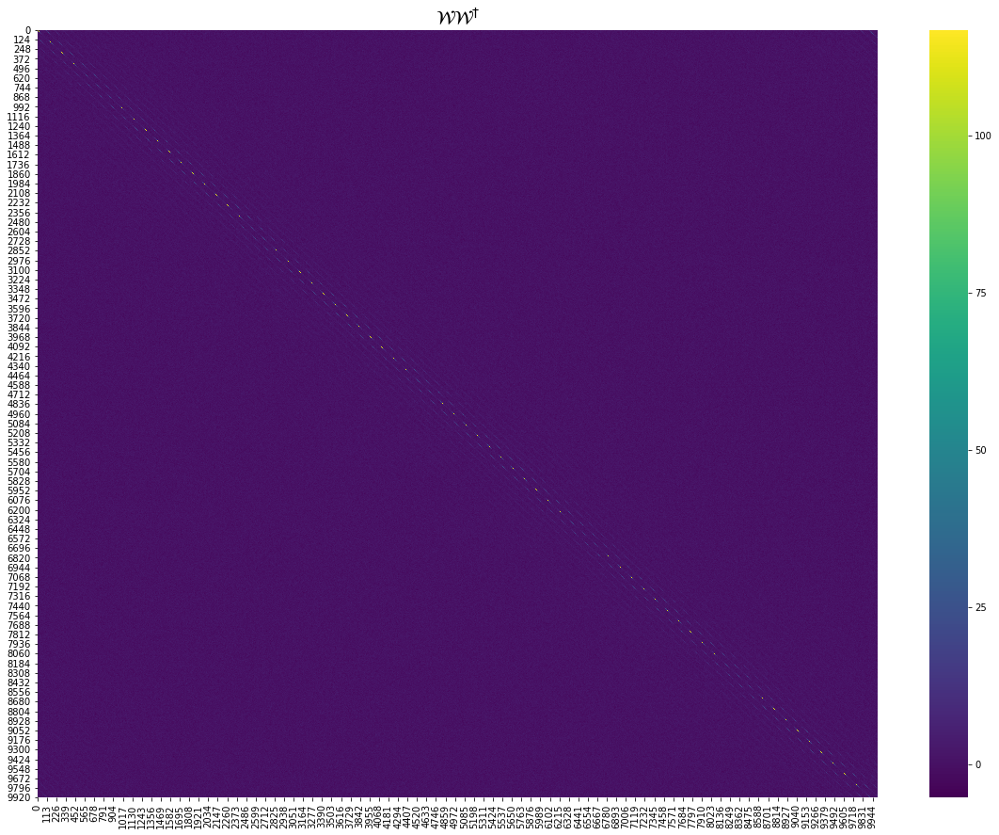

In [30]:
plt.figure(figsize=(20,15))
plt.title('${\cal W} {\cal W}^{\dag}$', fontsize= 20)
sns.heatmap(WW_all, linewidths= 0.0, cmap= 'viridis')
plt.show()

In [ ]:
plot_heatmap(WW, 
             L, 
             type_L = 'ALL',
             publication= True,
             eps= True,
             save= True)

#### Eigenvalues of ${\cal W} {\cal W}^T $

In [24]:
x = np.flip(np.arange(L*L))

In [25]:
eigen_val_vec = torch.eig(W_L100_all*W_L100_all.t(), eigenvectors= True)

In [28]:
eigen_ALL = eigen_val_vec[0][:,0]

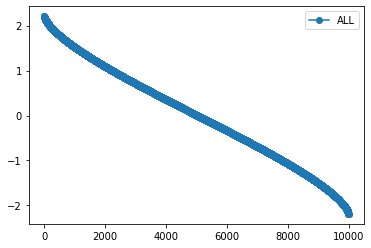

In [29]:
plt.plot(x, np.sort(eigen_ALL.numpy()), label= 'ALL', marker= 'o')
plt.legend()
plt.show()

In [26]:
type_L = 'ALL'
L_str = str(L)

file_name = 'weight_analysis/L%s/L%s_%s_WW_eigen_eigen_val.pt' % (L_str, L_str, type_L)
torch.save(eigen_val_vec[0], file_name)

file_name = 'weight_analysis/L%s/L%s_%s_WW_eigen_eigen_vac.pt' % (L_str, L_str, type_L)
torch.save(eigen_val_vec[1], file_name)

## Low

### Analysis of $ {\cal W}$

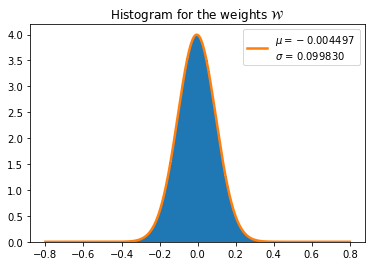

In [38]:
W_ = W_L100_low.numpy().reshape((W_L100_low.shape[0]*W_L100_low.shape[1]))

# Plot normalized histogram 
plt.hist(W_, bins= 100, density= True)

# Maximum and minimum of xticks to compute the theoretical distribution 
x_min, x_max = min(plt.xticks()[0]), max(plt.xticks()[0])  
domain = np.linspace(x_min, x_max, len(W_))

# Fitting a normal distribution
muW_, sigmaW_ = stats.norm.fit(W_) 

plot_pdf = stats.norm.pdf(domain, muW_, sigmaW_) # Fitting the PDF in the interval


plt.plot(domain, plot_pdf, linewidth= 2.5,
         label= '$\mu= %f$ \n$\sigma$ = %f' % (muW_, sigmaW_ ))

plt.title('Histogram for the weights ${\cal W}$')
plt.legend()
#plt.xlim([-1.5, 1.5])
plt.show()

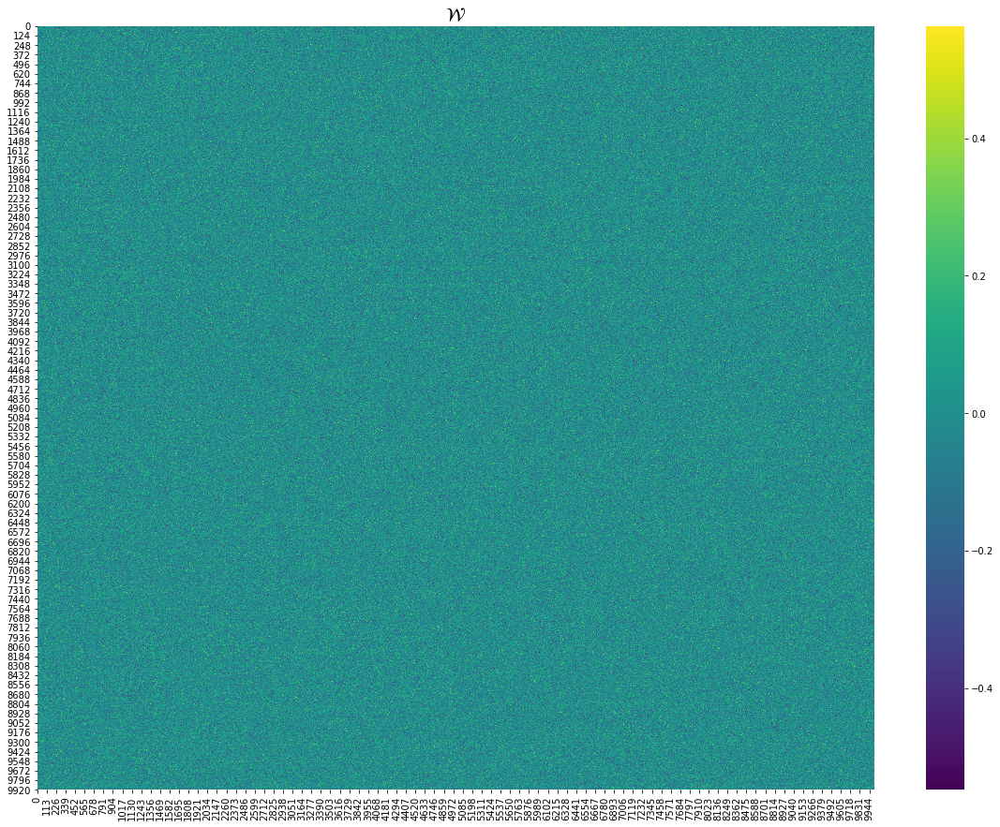

In [5]:
plt.figure(figsize=(20,15))
plt.title('${\cal W} $', fontsize= 20)
sns.heatmap(W_L010_low, linewidths= 0.0, cmap= 'viridis')
plt.show()

#### SVD of ${\cal W} $

In [14]:
u_L100_low, s_L100_low, v_L100_low = torch.svd(W_L100_low, compute_uv= True)

[]

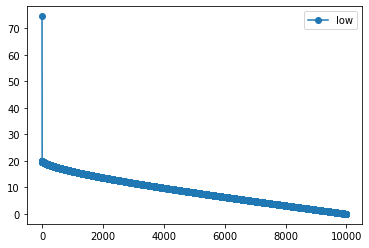

In [15]:
plt.plot(s_L100_low.numpy(), label= 'low', marker= 'o')
plt.legend()
plt.plot()

In [16]:
type_L = 'LOW'
L_str = str(L)

file_name = 'weight_analysis/L%s/L%s_%s_W_svd_left_eigvec.pt' % (L_str, L_str, type_L)
torch.save(u_L100_low, file_name)

file_name = 'weight_analysis/L%s/L%s_%s_W_svd_right_eigvec.pt' % (L_str, L_str, type_L)
torch.save(v_L100_low, file_name)

file_name = 'weight_analysis/L%s/L%s_%s_W_svd_singular_values.pt' % (L_str, L_str, type_L)
torch.save(s_L100_low, file_name)

#### Reduced ${\cal W} {\cal W}^{T}$ matrix

Here we construct the matrix ${\cal W} {\cal W}^{T}$ only with its first singular component.

In [83]:
s_L100_low_red = s_L100_low.clone()

s_L100_low_red[s_L100_low_red!= s_L100_low_red[0]] = 0

W_low_red = torch.mm(torch.mm(u_L100_low, torch.diag(s_L100_low_red)), v_L100_low.t())

In [84]:
WW = torch.mm(W_low_red.t(), W_low_red)

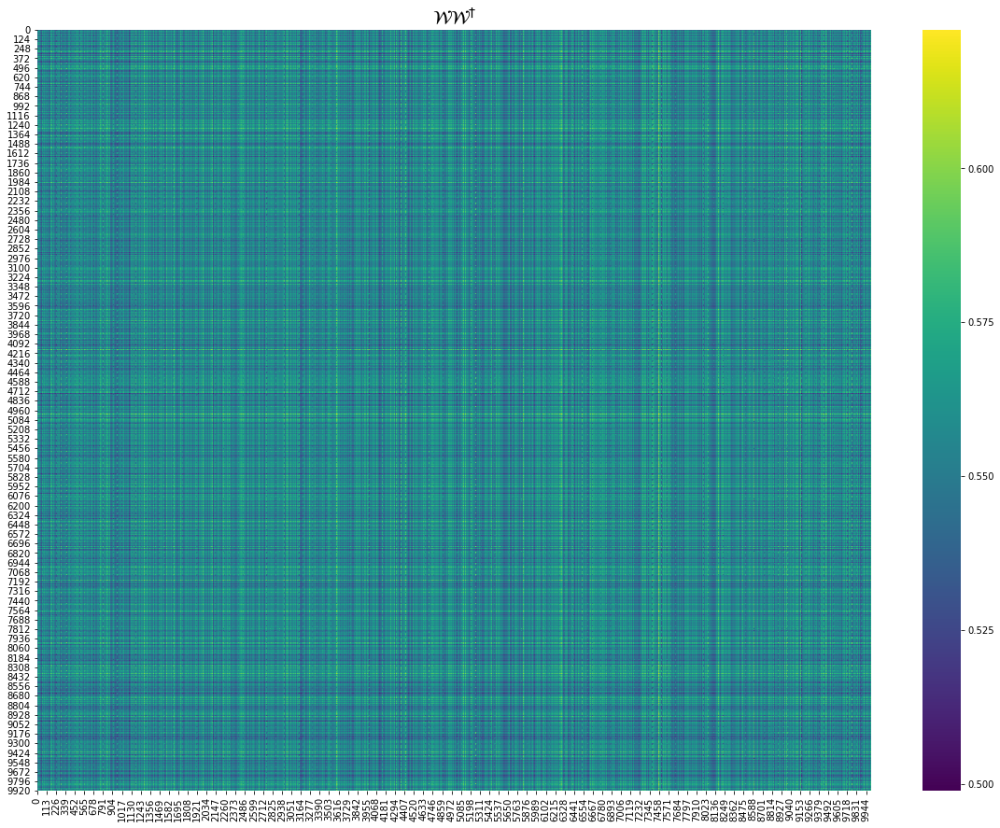

In [85]:
plt.figure(figsize=(20,15))
plt.title('${\cal W} {\cal W}^{\dag}$', fontsize= 20)
sns.heatmap(WW, linewidths= 0.0, cmap= 'viridis')
plt.show()

#### Sampling Ising states using the left singular vectors $u$

mag =  0.00240


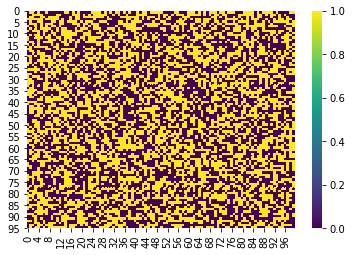

mag =  0.00600


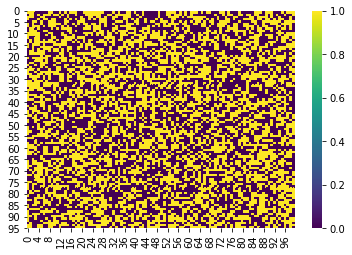

mag =  0.01540


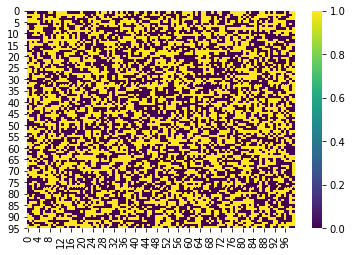

mag =  0.00980


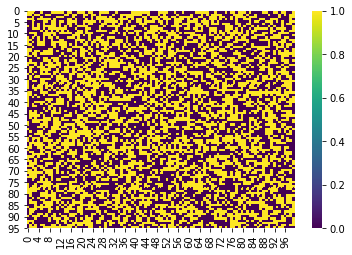

mag =  0.00180


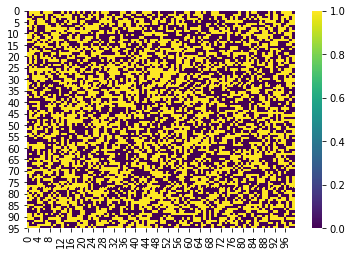

mag =  0.00720


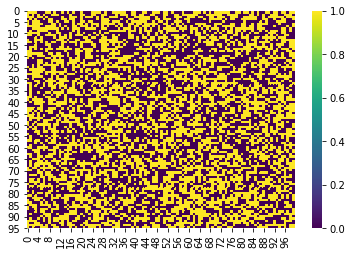

mag =  0.00180


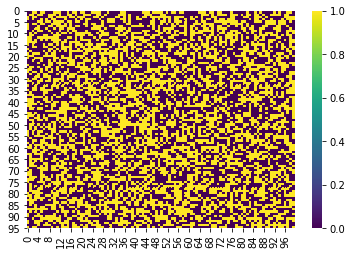

mag =  0.00320


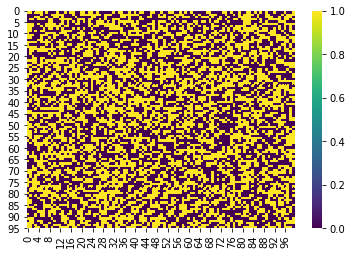

mag =  0.00940


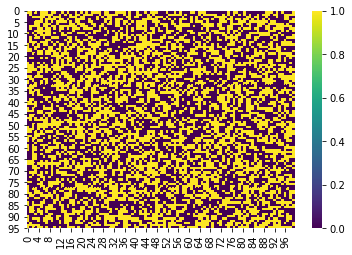

mag =  0.01140


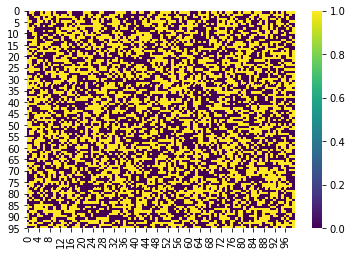

In [51]:
for j in range(10):
    p = torch.sigmoid(u_L100_low[j])
    rand_prob = torch.rand(p.size())
    state = F.relu( torch.sign( p - rand_prob ) ).reshape((100,100))
    mag = (2*state - 1 ).mean().abs().item()
    print('mag =  %.5f' % mag)
    sns.heatmap(state, linewidths= 0.0, cmap= 'viridis')
    plt.show()

#### Sampling Ising states using the right singular vectors $v$

mag =  0.02620


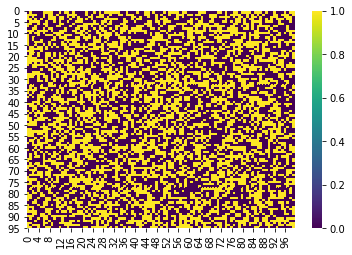

mag =  0.01300


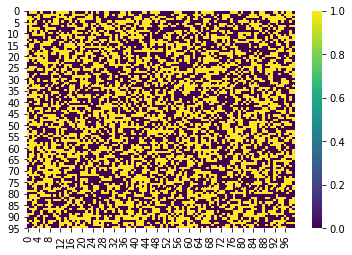

mag =  0.00060


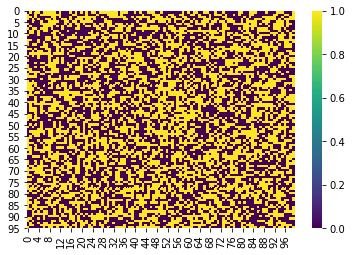

mag =  0.01460


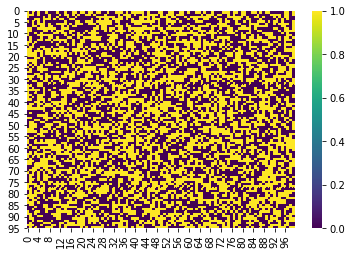

mag =  0.01520


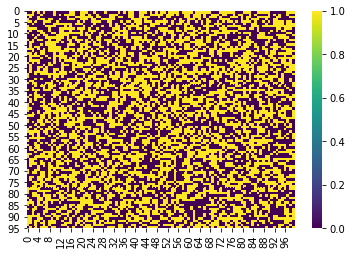

mag =  0.00540


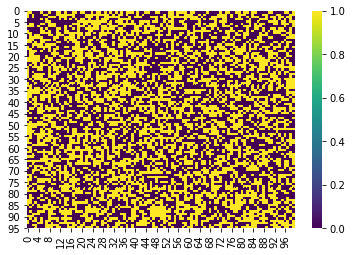

mag =  0.00480


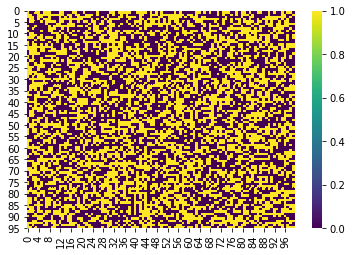

mag =  0.00540


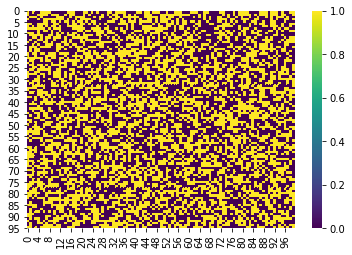

mag =  0.00340


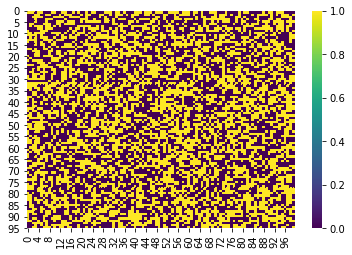

mag =  0.01080


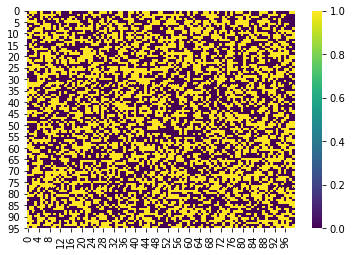

In [56]:
for j in range(10):
    p = torch.sigmoid(v_L100_low[j])
    rand_prob = torch.rand(p.size())
    state = F.relu( torch.sign( p - rand_prob ) ).reshape((100,100))
    mag = (2*state - 1 ).mean().abs().item()
    print('mag =  %.5f' % mag)
    sns.heatmap(state, linewidths= 0.0, cmap= 'viridis')
    plt.show()

#### Eigenvalues of ${\cal W} $

There are imaginary eigenvalues.

In [ ]:
eigen_val_vec_low_W = torch.eig(W_L100_low, eigenvectors= False)

In [ ]:
eigen_low_W = eigen_val_vec_low_W[0]
eigen_low_W

### Analysis of $ {\cal W} {\cal W}^{T}$

In [7]:
WW_low = torch.mm(W_L100_low.t(), W_L100_low)

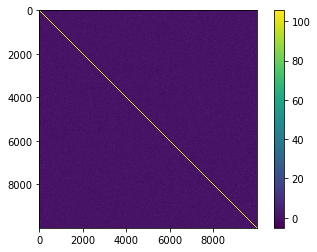

In [128]:
plt.imshow(WW_low.numpy(), cmap= 'viridis', alpha= 1.0)
plt.colorbar()
plt.xticks(np.arange(0, L*L, L*20))
plt.yticks(np.arange(0, L*L, L*20))
plt.show()

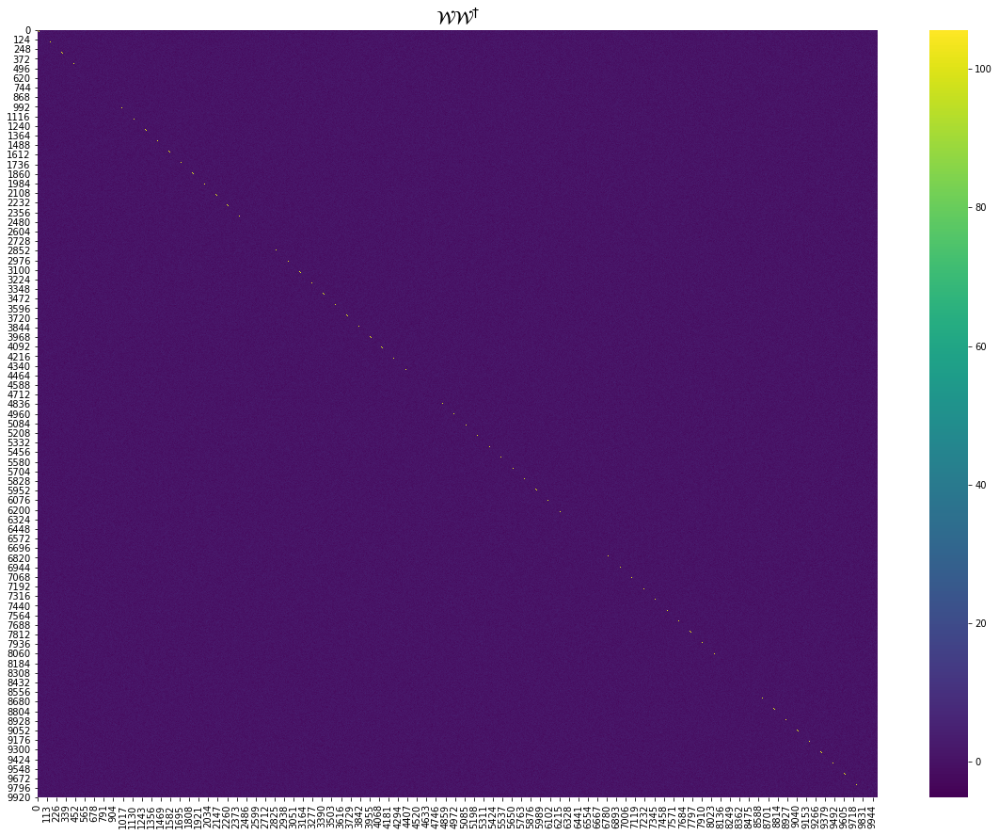

In [32]:
plt.figure(figsize=(20,15))
plt.title('${\cal W} {\cal W}^{\dag}$', fontsize= 20)
sns.heatmap(WW_low, linewidths= 0.0, cmap= 'viridis')
plt.show()

#### Eigenvalues of ${\cal W} {\cal W}^T $

In [30]:
eigen_val_vec_low = torch.eig(W_L100_low*W_L100_low.t(), eigenvectors= True)

In [38]:
eigen_LOW = eigen_val_vec_low[0][:,0]

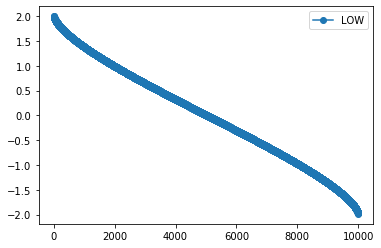

In [39]:
plt.plot(x, np.sort(eigen_LOW.numpy()), label= 'LOW', marker= 'o')
plt.legend()
plt.show()

In [31]:
type_L = 'LOW'
L_str = str(L)

file_name = 'weight_analysis/L%s/L%s_%s_WW_eigen_eigen_val.pt' % (L_str, L_str, type_L)
torch.save(eigen_val_vec_low[0], file_name)

file_name = 'weight_analysis/L%s/L%s_%s_WW_eigen_eigen_vac.pt' % (L_str, L_str, type_L)
torch.save(eigen_val_vec_low[1], file_name)

## High

### Analysis of $ {\cal W}$

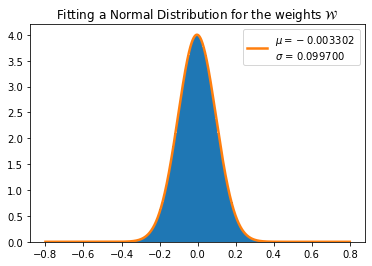

In [39]:
W_ = W_L100_high.numpy().reshape((W_L100_high.shape[0]*W_L100_high.shape[1]))

# Plot normalized histogram 
plt.hist(W_, bins= 100, density= True)

# Maximum and minimum of xticks to compute the theoretical distribution 
x_min, x_max = min(plt.xticks()[0]), max(plt.xticks()[0])  
domain = np.linspace(x_min, x_max, len(W_))

# Fitting a normal distribution
muW_, sigmaW_ = stats.norm.fit(W_) 

plot_pdf = stats.norm.pdf(domain, muW_, sigmaW_) # Fitting the PDF in the interval


plt.plot(domain, plot_pdf, linewidth= 2.5,
         label= '$\mu= %f$ \n$\sigma$ = %f' % (muW_, sigmaW_ ))

plt.title('Fitting a Normal Distribution for the weights ${\cal W}$')
plt.legend()
#plt.xlim([-5, 5])
plt.show()

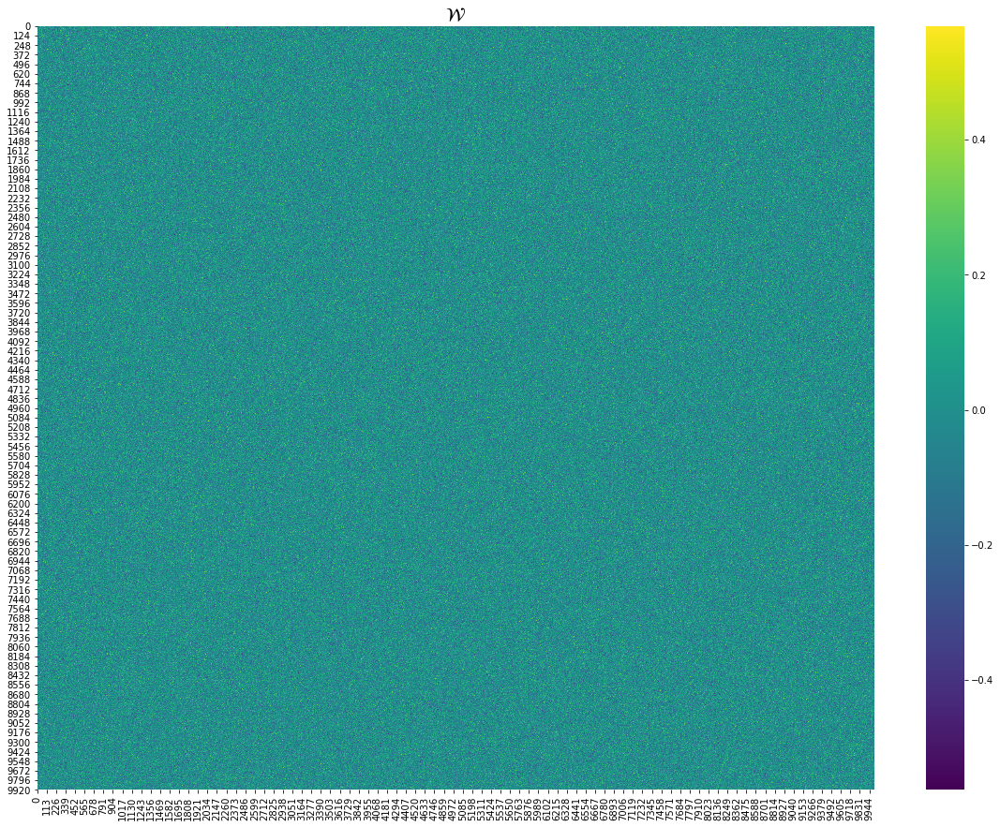

In [6]:
plt.figure(figsize=(20,15))
plt.title('${\cal W} $', fontsize= 20)
sns.heatmap(W_L010_high, linewidths= 0.0, cmap= 'viridis')
plt.show()

#### SVD of ${\cal W} $

In [17]:
u_L100_high, s_L100_high, v_L100_high = torch.svd(W_L100_high, compute_uv= True)

[]

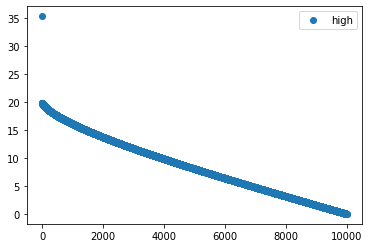

In [18]:
plt.plot(s_L100_high.numpy(), 'o', label= 'high', marker= 'o')
plt.legend()
plt.plot()

In [19]:
type_L = 'HIGH'
L_str = str(L)

file_name = 'weight_analysis/L%s/L%s_%s_W_svd_left_eigvec.pt' % (L_str, L_str, type_L)
torch.save(u_L100_high, file_name)

file_name = 'weight_analysis/L%s/L%s_%s_W_svd_right_eigvec.pt' % (L_str, L_str, type_L)
torch.save(v_L100_high, file_name)

file_name = 'weight_analysis/L%s/L%s_%s_W_svd_singular_values.pt' % (L_str, L_str, type_L)
torch.save(s_L100_high, file_name)

#### Reduced ${\cal W} {\cal W}^{T}$ matrix

Here we construct the matrix ${\cal W} {\cal W}^{T}$ only with its first singular component.

In [42]:
s_L100_high_red = s_L100_high.clone()

s_L100_high_red[s_L100_high_red!= s_L100_high_red[0]] = 0

W_high_red = torch.mm(torch.mm(u_L100_high, torch.diag(s_L100_high_red)), v_L100_high.t())

In [43]:
WW = torch.mm(W_high_red.t(), W_high_red)

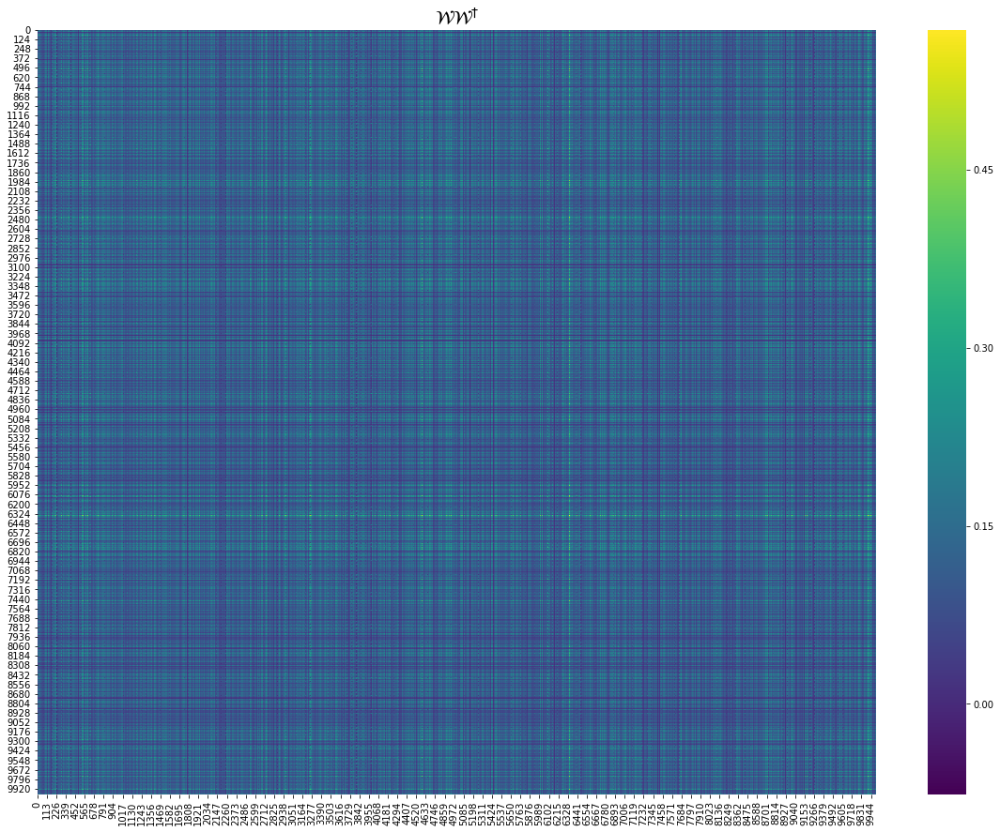

In [44]:
plt.figure(figsize=(20,15))
plt.title('${\cal W} {\cal W}^{\dag}$', fontsize= 20)
sns.heatmap(WW, linewidths= 0.0, cmap= 'viridis')
plt.show()

#### Sampling Ising states using the left singular vectors $u$

mag =  0.00100


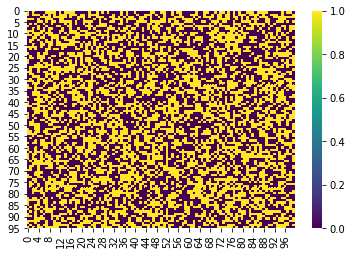

mag =  0.00520


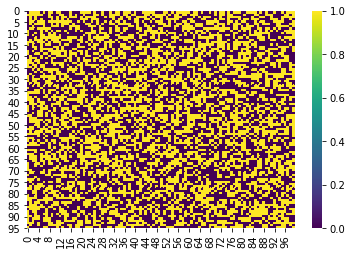

mag =  0.00120


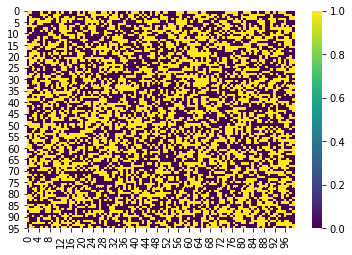

mag =  0.00360


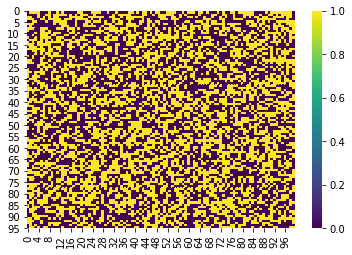

mag =  0.00380


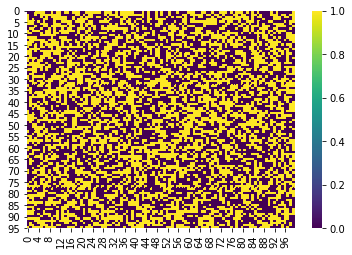

mag =  0.02080


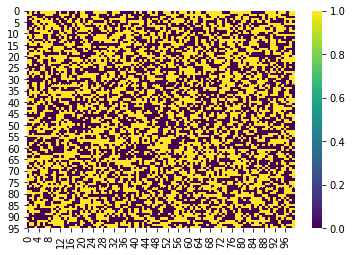

mag =  0.01060


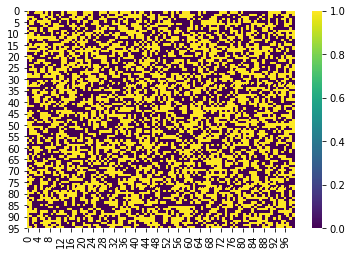

mag =  0.00160


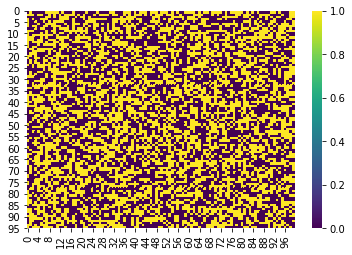

mag =  0.00060


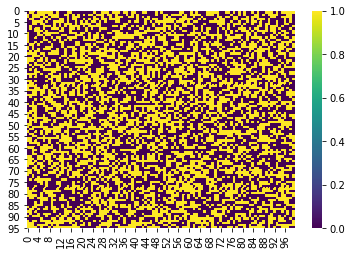

mag =  0.01040


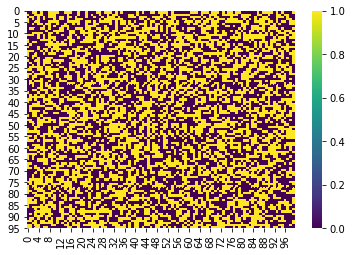

In [47]:
for j in range(10):
    p = torch.sigmoid(u_L100_high[j])
    rand_prob = torch.rand(p.size())
    state = F.relu( torch.sign( p - rand_prob ) ).reshape((100,100))
    mag = (2*state - 1 ).mean().abs().item()
    print('mag =  %.5f' % mag)
    sns.heatmap(state, linewidths= 0.0, cmap= 'viridis')
    plt.show()

#### Sampling Ising states using the right singular vectors $v$

mag =  0.00260


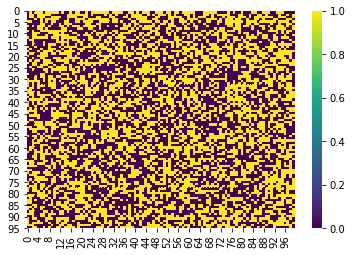

mag =  0.00400


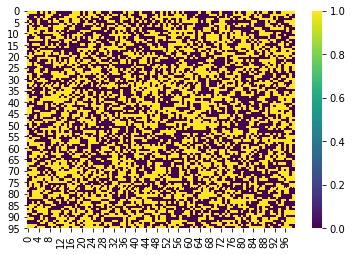

mag =  0.00860


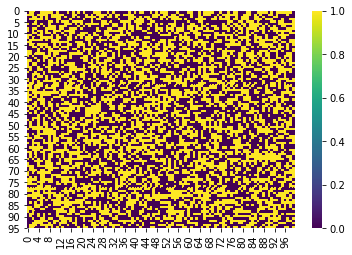

mag =  0.00260


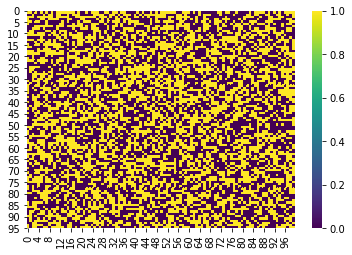

mag =  0.01420


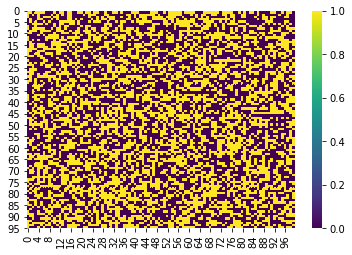

mag =  0.00860


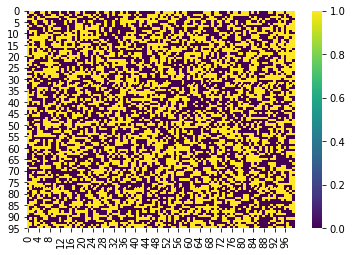

mag =  0.01460


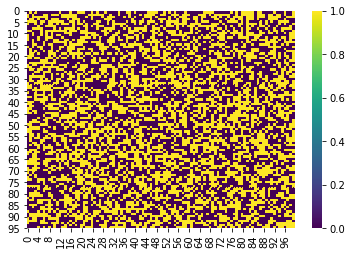

mag =  0.00020


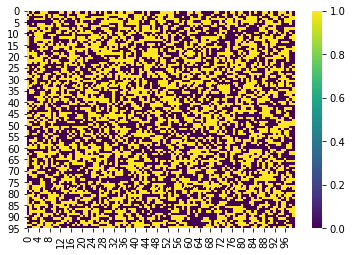

mag =  0.01320


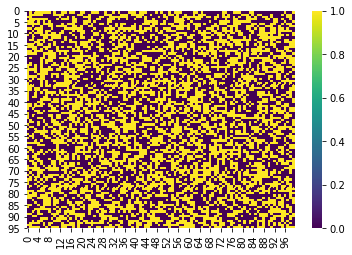

mag =  0.00940


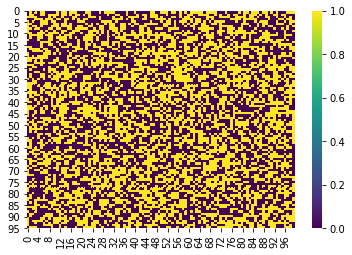

In [57]:
for j in range(10):
    p = torch.sigmoid(v_L100_high[j])
    rand_prob = torch.rand(p.size())
    state = F.relu( torch.sign( p - rand_prob ) ).reshape((100,100))
    mag = (2*state - 1 ).mean().abs().item()
    print('mag =  %.5f' % mag)
    sns.heatmap(state, linewidths= 0.0, cmap= 'viridis')
    plt.show()

#### Eigenvalues of ${\cal W} $

There are imaginary eigenvalues.

In [ ]:
eigen_val_vec_high_W = torch.eig(W_L100_high, eigenvectors= False)

In [ ]:
eigen_low_W = eigen_val_vec_high_W[0]
eigen_low_W

### Analysis of $ {\cal W} {\cal W}^{T}$

In [8]:
WW_high = torch.mm(W_L100_high.t(), W_L100_high)

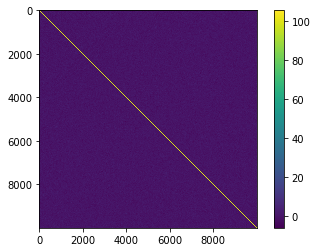

In [130]:
plt.imshow(WW_high.numpy(), cmap= 'viridis', alpha= 1.0)
plt.colorbar()
plt.xticks(np.arange(0, L*L, L*20))
plt.yticks(np.arange(0, L*L, L*20))
plt.show()

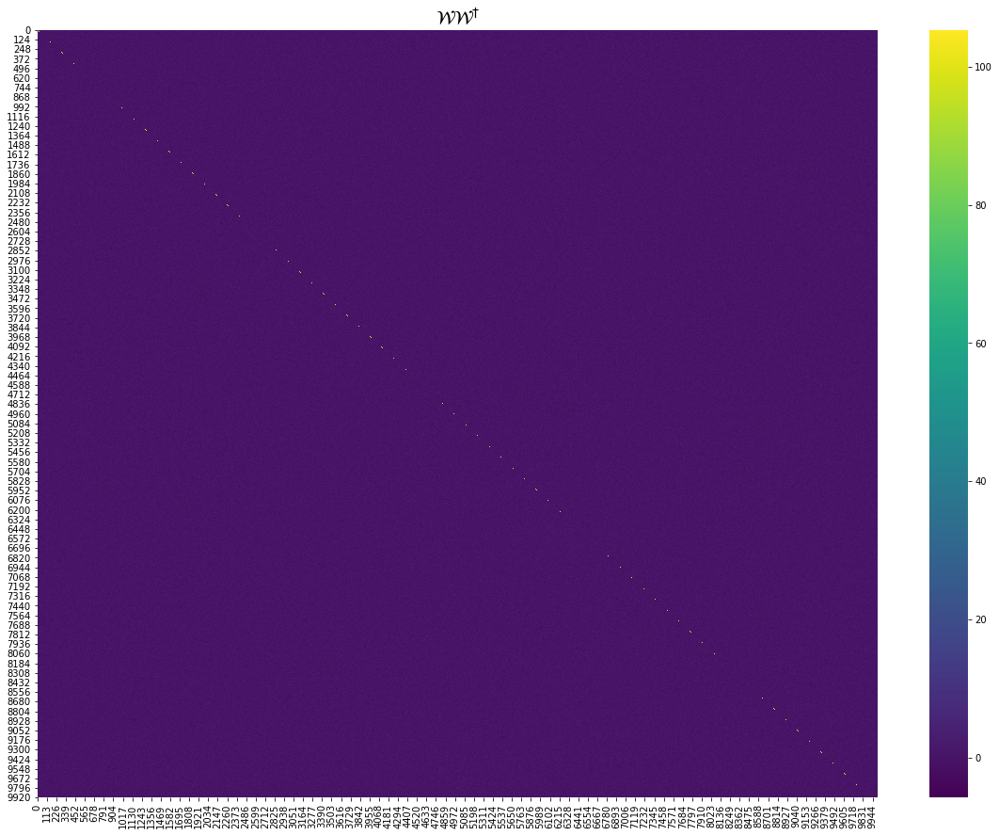

In [34]:
plt.figure(figsize=(20,15))
plt.title('${\cal W} {\cal W}^{\dag}$', fontsize= 20)
sns.heatmap(WW_high, linewidths= 0.0, cmap= 'viridis')
plt.show()

#### Eigenvalues of ${\cal W} {\cal W}^T $

In [32]:
eigen_val_vec_high = torch.eig(W_L100_high*W_L100_high.t(), eigenvectors= True)

In [40]:
eigen_high = eigen_val_vec_high[0][:,0]

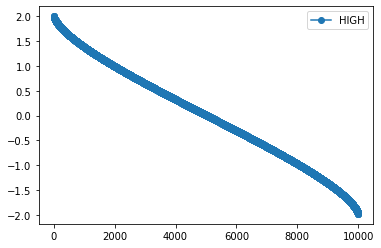

In [41]:
plt.plot(x, np.sort(eigen_high.numpy()), label= 'HIGH', marker= 'o')
plt.legend()
plt.show()

In [33]:
type_L = 'HIGH'
L_str = str(L)

file_name = 'weight_analysis/L%s/L%s_%s_WW_eigen_eigen_val.pt' % (L_str, L_str, type_L)
torch.save(eigen_val_vec_high[0], file_name)

file_name = 'weight_analysis/L%s/L%s_%s_WW_eigen_eigen_vac.pt' % (L_str, L_str, type_L)
torch.save(eigen_val_vec_high[1], file_name)

## $T=0$ and $T=\infty$

### Analysis of $ {\cal W}$

/home/rodsveiga/anaconda3/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


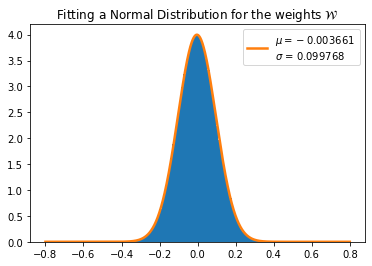

In [5]:
W_ = W_L100_low_high.numpy().reshape((W_L100_low_high.shape[0]*W_L100_low_high.shape[1]))

# Plot normalized histogram 
plt.hist(W_, bins= 100, density= True)

# Maximum and minimum of xticks to compute the theoretical distribution 
x_min, x_max = min(plt.xticks()[0]), max(plt.xticks()[0])  
domain = np.linspace(x_min, x_max, len(W_))

# Fitting a normal distribution
muW_, sigmaW_ = stats.norm.fit(W_) 

plot_pdf = stats.norm.pdf(domain, muW_, sigmaW_) # Fitting the PDF in the interval


plt.plot(domain, plot_pdf, linewidth= 2.5,
         label= '$\mu= %f$ \n$\sigma$ = %f' % (muW_, sigmaW_ ))

plt.title('Fitting a Normal Distribution for the weights ${\cal W}$')
plt.legend()
#plt.xlim([-5, 5])
plt.show()

#### SVD of ${\cal W} $

In [20]:
u_L100_low_high, s_L100_low_high, v_L100_low_high = torch.svd(W_L100_low_high, compute_uv= True)

[]

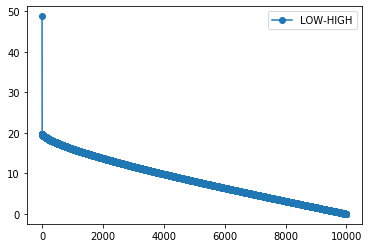

In [23]:
plt.plot(s_L100_low_high.numpy(), label= 'LOW-HIGH', marker= 'o')
plt.legend()
plt.plot()

In [21]:
type_L = 'LOW_HIGH'
L_str = str(L)

file_name = 'weight_analysis/L%s/L%s_%s_W_svd_left_eigvec.pt' % (L_str, L_str, type_L)
torch.save(u_L100_low_high, file_name)

file_name = 'weight_analysis/L%s/L%s_%s_W_svd_right_eigvec.pt' % (L_str, L_str, type_L)
torch.save(v_L100_low_high, file_name)

file_name = 'weight_analysis/L%s/L%s_%s_W_svd_singular_values.pt' % (L_str, L_str, type_L)
torch.save(s_L100_low_high, file_name)

#### Reduced ${\cal W} {\cal W}^{T}$ matrix

Here we construct the matrix ${\cal W} {\cal W}^{T}$ only with its first singular component.

In [45]:
s_L100_low_high_red = s_L100_low_high.clone()

s_L100_low_high_red[s_L100_low_high_red!= s_L100_low_high_red[0]] = 0

W_low_high_red = torch.mm(torch.mm(u_L100_low_high, torch.diag(s_L100_low_high_red)), v_L100_low_high.t())

In [46]:
WW = torch.mm(W_low_high_red.t(), W_low_high_red)

In [ ]:
plt.figure(figsize=(20,15))
plt.title('${\cal W} {\cal W}^{\dag}$', fontsize= 20)
sns.heatmap(WW, linewidths= 0.0, cmap= 'viridis')
plt.show()

#### Sampling Ising states using the left singular vectors $u$

mag =  0.00240


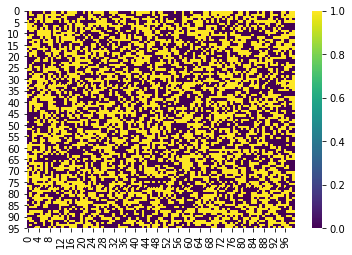

mag =  0.02060


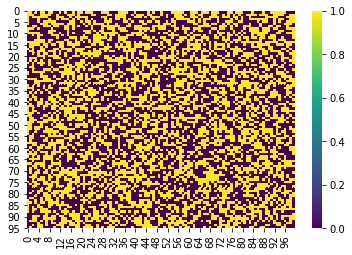

mag =  0.00940


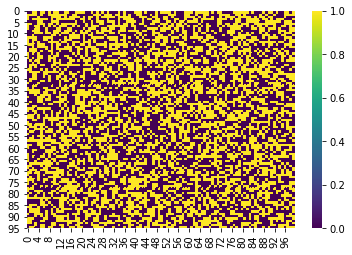

mag =  0.00080


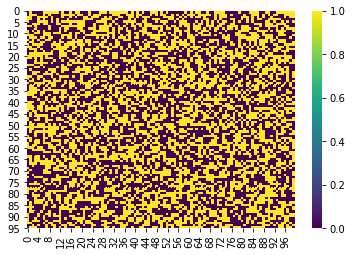

mag =  0.00260


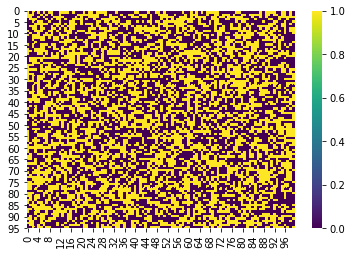

mag =  0.00840


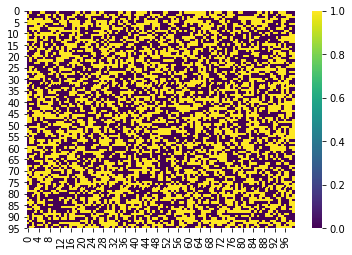

mag =  0.00300


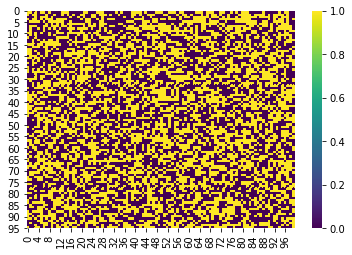

mag =  0.00880


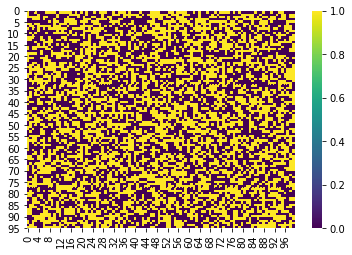

mag =  0.00360


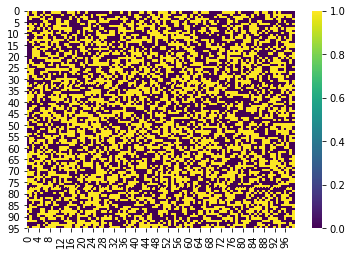

mag =  0.01140


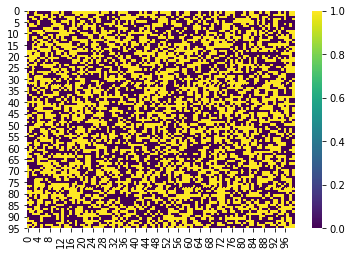

In [53]:
for j in range(10):
    p = torch.sigmoid(u_L100_low_high[j])
    rand_prob = torch.rand(p.size())
    state = F.relu( torch.sign( p - rand_prob ) ).reshape((100,100))
    mag = (2*state - 1 ).mean().abs().item()
    print('mag =  %.5f' % mag)
    sns.heatmap(state, linewidths= 0.0, cmap= 'viridis')
    plt.show()

#### Sampling Ising states using the right singular vectors $v$

mag =  0.00800


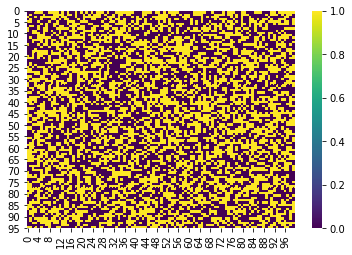

mag =  0.00240


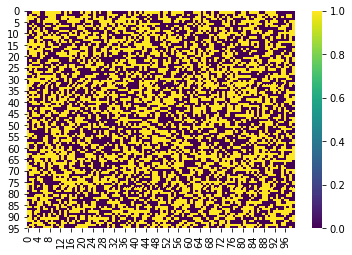

mag =  0.00660


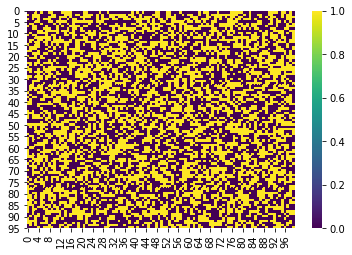

mag =  0.00660


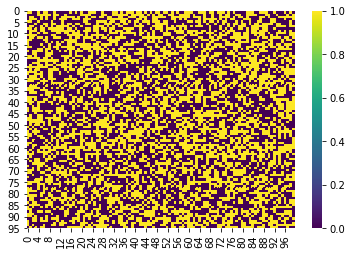

mag =  0.01300


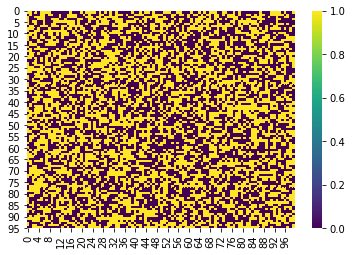

mag =  0.00520


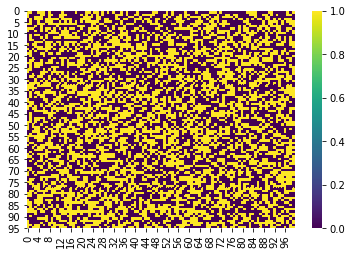

mag =  0.00040


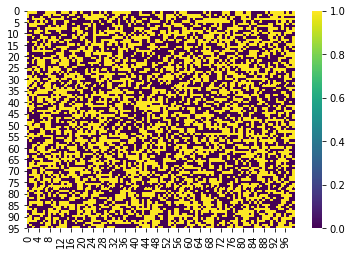

mag =  0.00920


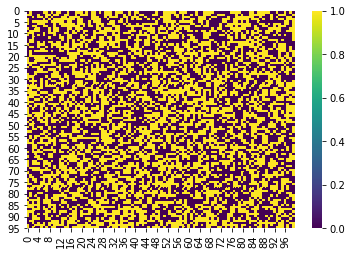

mag =  0.00880


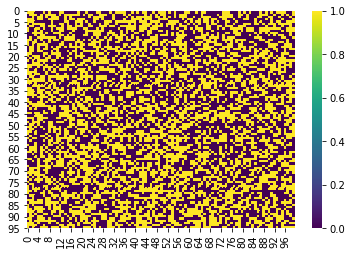

mag =  0.01020


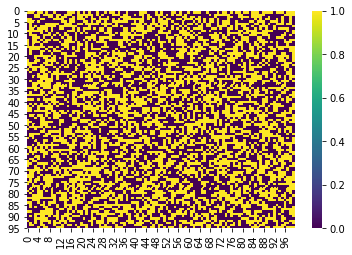

In [58]:
for j in range(10):
    p = torch.sigmoid(v_L100_low_high[j])
    rand_prob = torch.rand(p.size())
    state = F.relu( torch.sign( p - rand_prob ) ).reshape((100,100))
    mag = (2*state - 1 ).mean().abs().item()
    print('mag =  %.5f' % mag)
    sns.heatmap(state, linewidths= 0.0, cmap= 'viridis')
    plt.show()

#### Eigenvalues of ${\cal W} $

There are imaginary eigenvalues.

In [ ]:
eigen_val_vec_low_high_W = torch.eig(W_L100_low_high, eigenvectors= False)

In [ ]:
eigen_all_W = eigen_val_vec_low_high_W[0]
eigen_all_W

### Analysis of $ {\cal W} {\cal W}^{T}$

In [9]:
WW_low_high = torch.mm(W_L100_low_high.t(), W_L100_low_high)

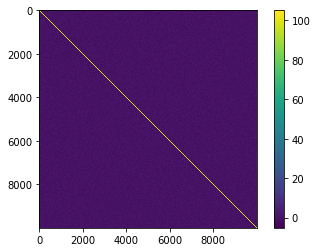

In [132]:
plt.imshow(WW_low_high.numpy(), cmap= 'viridis', alpha= 1.0)
plt.colorbar()
plt.xticks(np.arange(0, L*L, L*20))
plt.yticks(np.arange(0, L*L, L*20))
plt.show()

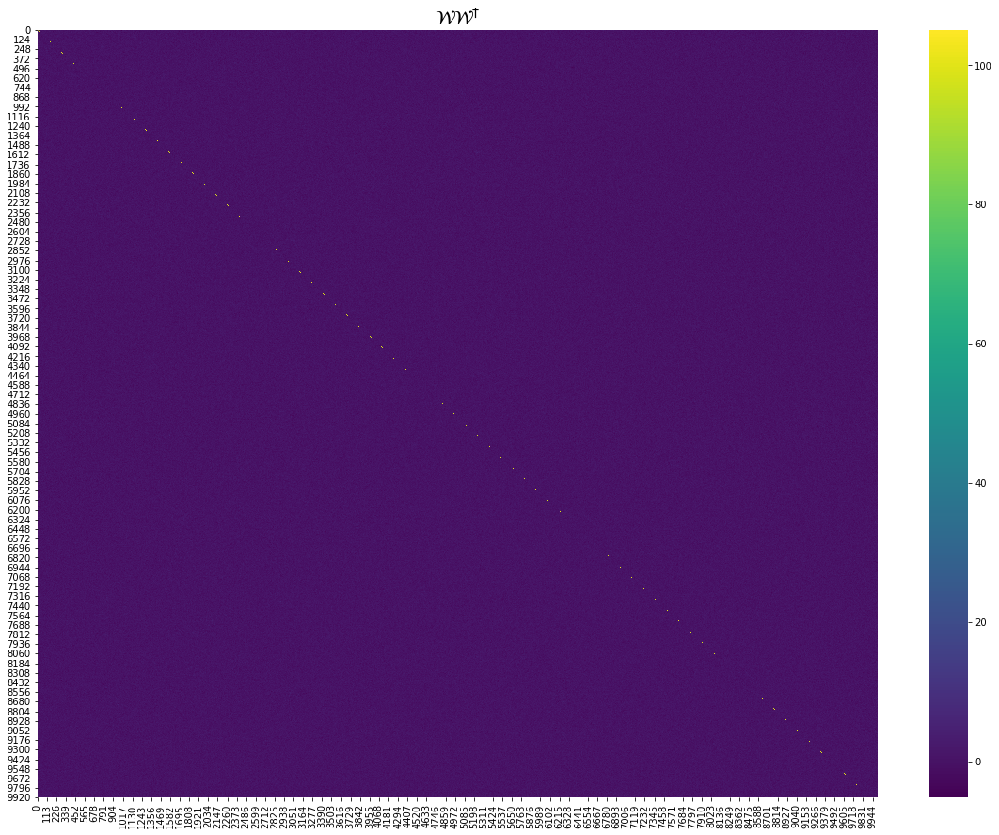

In [36]:
plt.figure(figsize=(20,15))
plt.title('${\cal W} {\cal W}^{\dag}$', fontsize= 20)
sns.heatmap(WW_low_high, linewidths= 0.0, cmap= 'viridis')
plt.show()

#### Eigenvalues of ${\cal W} {\cal W}^T $

In [34]:
eigen_val_vec_low_high = torch.eig(W_L100_low_high*W_L100_low_high.t(), eigenvectors= True)

In [36]:
eigen_low_high = eigen_val_vec_low_high[0][:,0]

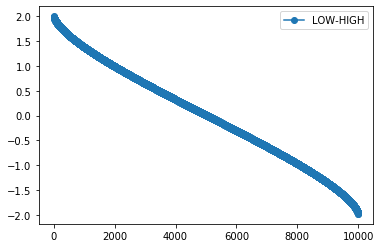

In [37]:
plt.plot(x, np.sort(eigen_low_high.numpy()), label= 'LOW-HIGH', marker= 'o')
plt.legend()
plt.show()

In [35]:
type_L = 'LOW_HIGH'
L_str = str(L)

file_name = 'weight_analysis/L%s/L%s_%s_WW_eigen_eigen_val.pt' % (L_str, L_str, type_L)
torch.save(eigen_val_vec_low_high[0], file_name)

file_name = 'weight_analysis/L%s/L%s_%s_WW_eigen_eigen_vac.pt' % (L_str, L_str, type_L)
torch.save(eigen_val_vec_low_high[1], file_name)

# Comparing eigenvalues of $ {\cal W} {\cal W}^T$

In [6]:
x = np.flip(np.arange(L*L))

In [14]:
eigen_ALL = torch.load('weight_analysis/L100/L100_ALL_WW_eigen_eigen_val.pt')
eigen_LOW = torch.load('weight_analysis/L100/L100_LOW_WW_eigen_eigen_val.pt')
eigen_high = torch.load('weight_analysis/L100/L100_HIGH_WW_eigen_eigen_val.pt')
eigen_low_high = torch.load('weight_analysis/L100/L100_LOW_HIGH_WW_eigen_eigen_val.pt')

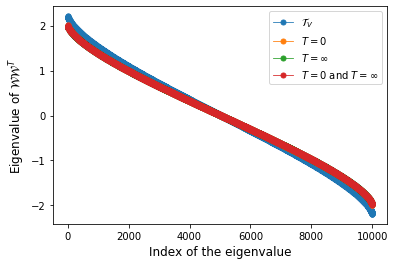

In [18]:
plot_eigen(x, 
           np.sort(eigen_ALL[:,0].numpy()),
           np.sort(eigen_LOW[:,0].numpy()),
           np.sort(eigen_high[:,0].numpy()),
           np.sort(eigen_low_high[:,0].numpy()),
           L,
           label_1= '${\cal T}_{V}$',
           label_2= '$T=0$',
           label_3= '$T=\infty$',
           label_4= '$T=0$ and $T=\infty$',
           xlabel= 'Index of the eigenvalue',
           ylabel= 'Eigenvalue of ${\cal W}{\cal W}^{T}$',
           SVD= False,
           publication= False,
           eps= False,
           save= False)

# Comparing singular values of $ {\cal W}$

In [4]:
s_L100_all = torch.load('weight_analysis/L100/L100_ALL_W_svd_singular_values.pt')
s_L100_low = torch.load('weight_analysis/L100/L100_LOW_W_svd_singular_values.pt')
s_L100_high = torch.load('weight_analysis/L100/L100_HIGH_W_svd_singular_values.pt')
s_L100_low_high = torch.load('weight_analysis/L100/L100_LOW_HIGH_W_svd_singular_values.pt')

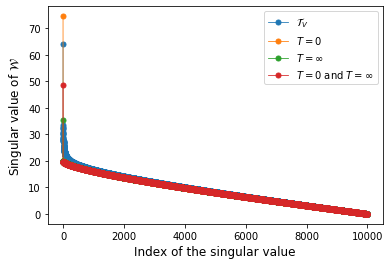

In [13]:
plot_eigen(x, 
           np.sort(s_L100_all.numpy()),
           np.sort(s_L100_low.numpy()),
           np.sort(s_L100_high.numpy()),
           np.sort(s_L100_low_high.numpy()),
           L,
           label_1= '${\cal T}_{V}$',
           label_2= '$T=0$',
           label_3= '$T=\infty$',
           label_4= '$T=0$ and $T=\infty$',
           xlabel= 'Index of the singular value',
           ylabel= 'Singular value of ${\cal W}$',
           SVD= True,
           publication= False,
           eps= False,
           save= False)

# Comparing matrices $ {\cal W} {\cal W}^{T}$

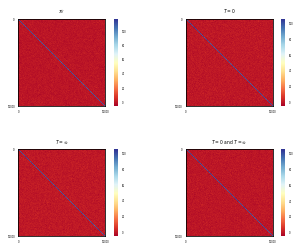

In [24]:
plot_heatmaps(WW_all.numpy(),
              WW_low.numpy(),
              WW_high.numpy(),
              WW_low_high.numpy(),
              L,
              cmap= 'RdYlBu',
              title_size= 4.5,
              labelsize= 2.5,
              zoom= False,
              publication= False,
              eps= False,
              save= False)

## Zooming into the near diagonal elements

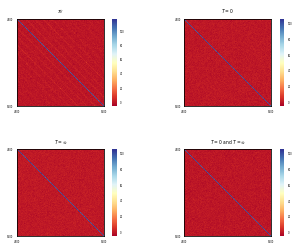

In [21]:
plot_heatmaps(WW_all.numpy(),
              WW_low.numpy(),
              WW_high.numpy(),
              WW_low_high.numpy(),
              L, 
              cmap= 'RdYlBu',
              title_size= 4.5,
              labelsize= 2.5,
              zoom= True,
              publication= False,
              eps= False,
              save= False)